In [8]:
import pandas as pd

In [9]:
df= pd.read_csv('df_permeability_only.csv')

PCA components: 7
Explained variance ratio (cumulative): 0.9541708495788765
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.016515 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1785
[LightGBM] [Info] Number of data points in the train set: 15520, number of used features: 7
[LightGBM] [Info] Start training from score 134.207844

---- Train Performance ----
R²: 0.6502415038853093
RMSE: 92.45254554711727
MAE: 58.6827017162114

---- Test Performance ----
R²: 0.45024999090183115
RMSE: 108.84549973501788
MAE: 70.28400720688305


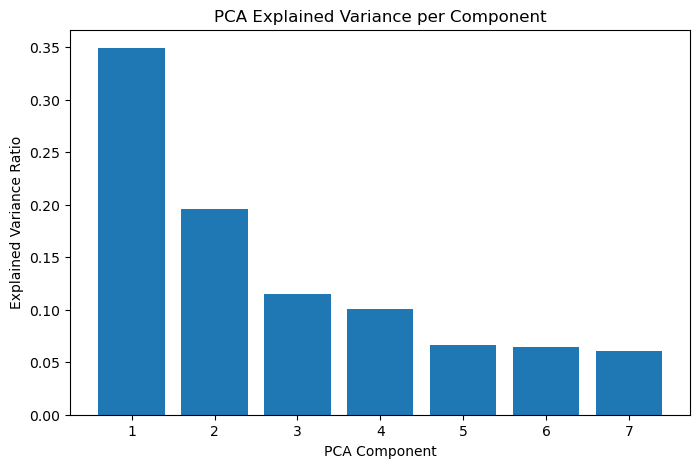

In [10]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import lightgbm as lgb

# ---------------- Load dataset ----------------
# if already loaded, skip this
# df = pd.read_csv("your_dataset.csv")

# Drop non-numeric cols like well/TVD if still present
X = df.drop(columns=["PERM", "well", "TVD"], errors="ignore")
y = df["PERM"]

# ---------------- Train-Test Split ----------------
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# ---------------- Standardize & PCA ----------------
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# keep 95% variance
pca = PCA(n_components=0.95, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

print("PCA components:", X_train_pca.shape[1])
print("Explained variance ratio (cumulative):", pca.explained_variance_ratio_.sum())

# ---------------- LightGBM Model ----------------
# ---------------- LightGBM Model ----------------
lgb_reg = lgb.LGBMRegressor(
    objective="regression",
    n_estimators=2000,
    learning_rate=0.01,
    num_leaves=31,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    n_jobs=-1
)

# ✅ FIX: remove verbose
lgb_reg.fit(
    X_train_pca, y_train,
    eval_set=[(X_test_pca, y_test)],
    eval_metric="l2"
    # callbacks=[lgb.log_evaluation(100)]  # <-- uncomment if you want logs every 100 rounds
)

# ---------------- Predictions ----------------
y_train_pred = lgb_reg.predict(X_train_pca)
y_test_pred = lgb_reg.predict(X_test_pca)

# ---------------- Evaluation ----------------
def evaluate(y_true, y_pred, dataset="Test"):
    print(f"\n---- {dataset} Performance ----")
    print("R²:", r2_score(y_true, y_pred))
    print("RMSE:", np.sqrt(mean_squared_error(y_true, y_pred)))
    print("MAE:", mean_absolute_error(y_true, y_pred))

evaluate(y_train, y_train_pred, "Train")
evaluate(y_test, y_test_pred, "Test")

# ---------------- PCA Component Importance ----------------
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
plt.bar(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel("PCA Component")
plt.ylabel("Explained Variance Ratio")
plt.title("PCA Explained Variance per Component")
plt.show()


In [11]:
df = pd.read_csv("new_training_permeability_dataset.csv")
df

,PERM,inst_freq,sweetness,grad,local_std,spec_slope,band_ratio_high_low,coherency,rms_w5,rms_w11,rms_w21
0,124.579900,0.022367,143.795827,-866.149624,1141.552948,-3.708957,0.000004,0.209411,1269.345630,1586.017227,2383.789488
1,125.334580,0.023383,151.098987,-928.767799,1173.743265,-3.708957,0.000004,0.200210,1003.304198,1415.886194,2301.315299
2,117.121100,0.023441,151.831220,-946.766737,1203.747743,-3.708957,0.000004,0.282946,766.467530,1295.974324,2244.971504
3,109.646790,0.023284,150.904351,-946.766726,1230.138136,-3.708957,0.000004,0.425494,602.268644,1242.459274,2223.541698
4,106.011070,0.023276,150.957224,-946.766741,1251.369346,-3.708957,0.000004,0.570433,603.055910,1269.538864,2238.893364
...,...,...,...,...,...,...,...,...,...,...,...
18123,63.008507,0.019827,10.837232,46.183731,53.745445,-3.692144,0.000003,0.014171,61.944085,81.792285,134.473859
18124,67.392227,0.018724,14.889511,46.183736,49.857469,-3.692144,0.000003,0.011904,50.675887,72.193608,121.495398
18125,66.598824,0.013416,11.265834,46.183737,45.480217,-3.692144,0.000003,0.010214,40.327787,63.078704,109.480569
18126,51.396645,0.008711,8.906156,46.183738,40.873942,-3.692144,0.000003,0.008837,30.632462,54.311164,98.164425


In [12]:
# Diagnostics + robust training + safe metric computation
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import r2_score, mean_squared_error
from xgboost import XGBRegressor
import math

def show_inf_nan_info(name, arr):
    arr = np.asarray(arr)
    print(f"{name}: shape={arr.shape}, n_nan={np.isnan(arr).sum()}, n_posinf={np.isposinf(arr).sum()}, n_neginf={np.isneginf(arr).sum()}, max={np.nanmax(arr) if arr.size else 'NA'}, min={np.nanmin(arr) if arr.size else 'NA'}")

# 1) load data
df = pd.read_csv("new_training_permeability_dataset.csv")
print("Loaded df:", df.shape)
assert "PERM" in df.columns, "PERM column missing"

# 2) simple cleaning for features & target
# drop columns that are completely empty
df = df.loc[:, df.notna().any(axis=0)]

# Identify features and target
X = df.drop(columns=["PERM"]).copy()
y = df["PERM"].astype(float).copy()

# 3) Basic diagnostics
print("\n-- Initial diagnostics --")
show_inf_nan_info("y (PERM)", y)
for c in X.columns:
    if X[c].isna().any() or np.isinf(X[c]).any():
        print(f"Feature '{c}' has NaN/inf counts: NaN={X[c].isna().sum()}, posinf={(np.isposinf(X[c])).sum()}, neginf={(np.isneginf(X[c])).sum()}")

# 4) Impute feature NaN/inf with median (safe)
feature_medians = X.replace([np.inf, -np.inf], np.nan).median()
X = X.replace([np.inf, -np.inf], np.nan).fillna(feature_medians)

# Re-check
print("\n-- After imputing feature NaN/inf with median --")
for c in X.columns:
    if X[c].isna().any() or np.isinf(X[c]).any():
        print("WARNING: still inf/NaN in", c)
show_inf_nan_info("X (flat view)", X.values.flatten())

# 5) Handle target zeros/negatives (clip small positives) before log
eps = 1e-6
n_nonpos = (y <= 0).sum()
if n_nonpos:
    print(f"Found {n_nonpos} non-positive PERM values — clipping to {eps}")
y_safe = y.clip(lower=eps)

# 6) Create log-target
y_log = np.log10(y_safe)

# Check for inf/nan in y_log
show_inf_nan_info("y_log", y_log)

# 7) Train-test split
X_train, X_test, y_train_log, y_test_log, y_train_orig, y_test_orig = train_test_split(
    X, y_log, y_safe, test_size=0.20, random_state=42
)

# 8) Scale features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 9) Model + RandomizedSearch (on log target)
param_dist = {
    "n_estimators": [100, 200, 400, 600],
    "learning_rate": np.linspace(0.01, 0.2, 10),
    "max_depth": [3, 4, 5, 6, 8],
    "subsample": np.linspace(0.6, 1.0, 5),
    "colsample_bytree": np.linspace(0.6, 1.0, 5),
    "gamma": [0, 0.1, 0.2, 0.3],
}

xgb = XGBRegressor(objective="reg:squarederror", random_state=42, n_jobs=-1)

random_search = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=30,
    scoring="r2",
    cv=3,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

print("\nFitting RandomizedSearchCV on log(PERM) — this may take a while")
random_search.fit(X_train_scaled, y_train_log)

best_model = random_search.best_estimator_
print("Best params:", random_search.best_params_)

# 10) Predict (log-space) and safe inverse transform
y_pred_log = best_model.predict(X_test_scaled)

# Diagnostics for predictions
show_inf_nan_info("y_pred_log", y_pred_log)

# If predictions contain inf or nan, replace them robustly:
if np.any(np.isinf(y_pred_log)) or np.any(np.isnan(y_pred_log)):
    # Replace inf with large finite values, nan -> median of y_train_log
    finite_mask = np.isfinite(y_pred_log)
    if finite_mask.sum() == 0:
        raise RuntimeError("All predictions are non-finite — model diverged.")
    finite_vals = y_pred_log[finite_mask]
    med = np.median(finite_vals)
    # Replace +inf with max_finite, -inf with min_finite, nan with median
    max_f = np.max(finite_vals)
    min_f = np.min(finite_vals)
    y_pred_log = np.where(np.isposinf(y_pred_log), max_f, y_pred_log)
    y_pred_log = np.where(np.isneginf(y_pred_log), min_f, y_pred_log)
    y_pred_log = np.where(np.isnan(y_pred_log), med, y_pred_log)
    print("Replaced non-finite predictions with finite substitutes (max/min/median).")

# 11) Inverse transform to original space and clip to reasonable ranges
y_pred = 10 ** y_pred_log

# Clip predictions to 2nd-98th percentile of training original target to avoid crazy outliers
low, high = np.percentile(10**(np.array(y_train_log)), [2, 98])
y_pred_clipped = np.clip(y_pred, low, high*10)  # allow some headroom

# 12) Final diagnostics & metrics
print("\n-- Final diagnostics --")
show_inf_nan_info("y_test_orig", y_test_orig)
show_inf_nan_info("y_pred (clipped)", y_pred_clipped)

r2_orig = r2_score(y_test_orig, y_pred_clipped)
rmse_orig = np.sqrt(mean_squared_error(y_test_orig, y_pred_clipped))

r2_log = r2_score(y_test_log, y_pred_log)
rmse_log = np.sqrt(mean_squared_error(y_test_log, y_pred_log))

print(f"R2 (original space): {r2_orig:.4f}, RMSE (orig): {rmse_orig:.4f}")
print(f"R2 (log space): {r2_log:.4f}, RMSE (log): {rmse_log:.4f}")


Loaded df: (18128, 11)

-- Initial diagnostics --
y (PERM): shape=(18128,), n_nan=0, n_posinf=0, n_neginf=0, max=2955.5688, min=0.638143

-- After imputing feature NaN/inf with median --
X (flat view): shape=(181280,), n_nan=0, n_posinf=0, n_neginf=0, max=10514.525086555605, min=-1246.9614160027827
y_log: shape=(18128,), n_nan=0, n_posinf=0, n_neginf=0, max=3.47064107334912, min=-0.19508199031957665

Fitting RandomizedSearchCV on log(PERM) — this may take a while
Fitting 3 folds for each of 30 candidates, totalling 90 fits
Best params: {'subsample': 0.6, 'n_estimators': 400, 'max_depth': 8, 'learning_rate': 0.07333333333333333, 'gamma': 0.1, 'colsample_bytree': 0.7}
y_pred_log: shape=(3626,), n_nan=0, n_posinf=0, n_neginf=0, max=2.8997483253479004, min=0.14497581124305725

-- Final diagnostics --
y_test_orig: shape=(3626,), n_nan=0, n_posinf=0, n_neginf=0, max=2295.6963, min=0.975701
y_pred (clipped): shape=(3626,), n_nan=0, n_posinf=0, n_neginf=0, max=793.8680419921875, min=2.47702980

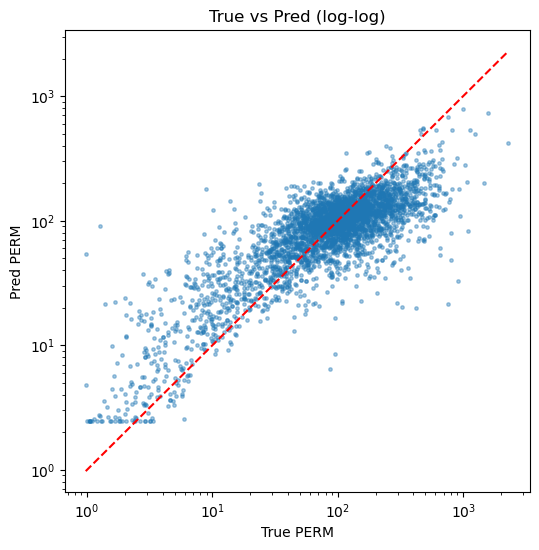

In [13]:
import matplotlib.pyplot as plt
plt.figure(figsize=(6,6))
plt.scatter(y_test_orig, y_pred_clipped, s=6, alpha=0.4)
plt.plot([y_test_orig.min(), y_test_orig.max()],
         [y_test_orig.min(), y_test_orig.max()], 'r--')
plt.xscale('log'); plt.yscale('log')
plt.xlabel('True PERM'); plt.ylabel('Pred PERM')
plt.title('True vs Pred (log-log)')
plt.show()


In [14]:
# Predict-permeability-on-test-seismic.py (notebook cell)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
from math import isfinite

TEST_CSV = "test_pores_inline_348_A10.csv"
MODEL_FILE = "xgb_earlystop_log_model.joblib"   # fallback model filename
SCALER_FILE = "scaler.joblib"
TRAIN_CSV = "new_training_permeability_dataset.csv"  # used only if feature names/means missing
OUT_PRED_CSV = "predicted_perm_inline_348.csv"
OUT_PIVOT_CSV = "predicted_perm_map_inline_348_pivot.csv"
OUT_PIVOT_PNG = "predicted_perm_map_inline_348.png"
CHUNK_SIZE = 50000

# --- 1) load model & scaler (or use variables in memory) ---
try:
    # prefer joblib saved artifacts
    if os.path.exists(MODEL_FILE) and os.path.exists(SCALER_FILE):
        model = joblib.load(MODEL_FILE)
        scaler = joblib.load(SCALER_FILE)
        print("Loaded model & scaler from disk.")
    else:
        # try to use variables if they exist in the notebook
        model = globals().get("xgb", globals().get("best_model", None))
        scaler = globals().get("scaler", None)
        if model is None or scaler is None:
            raise FileNotFoundError("No saved model/scaler found and no 'best_model'/'scaler' variables in workspace.")
        print("Using model & scaler from notebook variables.")
except Exception as e:
    raise RuntimeError("Cannot load model/scaler: " + str(e))

# --- 2) determine training features & training feature means for imputation ---
feature_cols = None
feature_means = None

# try scaler metadata
if hasattr(scaler, "feature_names_in_"):
    feature_cols = list(getattr(scaler, "feature_names_in_"))
if hasattr(scaler, "feature_means_"):
    feature_means = getattr(scaler, "feature_means_")

# fallback: infer from training CSV if available
if feature_cols is None or feature_means is None:
    if os.path.exists(TRAIN_CSV):
        df_train_tmp = pd.read_csv(TRAIN_CSV, nrows=10)
        feature_cols = [c for c in df_train_tmp.columns if c != "PERM"]
        # load only feature columns to compute means
        feature_means = pd.read_csv(TRAIN_CSV, usecols=feature_cols).mean().to_dict()
        print("Inferred features & means from TRAIN_CSV.")
    else:
        raise RuntimeError("Can't determine training feature list/means. Provide saved scaler with metadata or TRAIN_CSV.")

print(f"Using {len(feature_cols)} training features.")

# --- 3) helper to align a chunk to training features and predict ---
def align_and_predict_chunk(chunk_df):
    # keep a copy to attach predictions
    original = chunk_df.copy()
    # create aligned df with training features in exact order
    aligned = pd.DataFrame(index=chunk_df.index)
    for f in feature_cols:
        if f in chunk_df.columns:
            aligned[f] = chunk_df[f].values
        else:
            # fallback: use training mean for missing feature
            aligned[f] = feature_means.get(f, 0.0)
    # replace inf/-inf with median
    aligned = aligned.replace([np.inf, -np.inf], np.nan)
    aligned = aligned.fillna(pd.Series(feature_means))
    # scale
    Xs = scaler.transform(aligned.values)
    # predict log-perm
    pred_log = model.predict(Xs)
    pred_log = np.asarray(pred_log, dtype=float)
    # guard against non-finite preds
    if not np.isfinite(pred_log).all():
        finite_mask = np.isfinite(pred_log)
        if finite_mask.sum() == 0:
            raise RuntimeError("All predictions non-finite — model diverged on this chunk.")
        med = np.median(pred_log[finite_mask])
        maxf = np.max(pred_log[finite_mask])
        minf = np.min(pred_log[finite_mask])
        pred_log = np.where(np.isposinf(pred_log), maxf, pred_log)
        pred_log = np.where(np.isneginf(pred_log), minf, pred_log)
        pred_log = np.where(np.isnan(pred_log), med, pred_log)
    pred_perm = 10 ** pred_log
    original["PRED_LOG_PERM"] = pred_log
    original["PRED_PERM"] = pred_perm
    return original

# --- 4) Stream through test CSV in chunks, predict, and append to output CSV ---
if os.path.exists(OUT_PRED_CSV):
    os.remove(OUT_PRED_CSV)

rows = 0
for chunk in pd.read_csv(TEST_CSV, chunksize=CHUNK_SIZE):
    out_chunk = align_and_predict_chunk(chunk)
    if rows == 0:
        out_chunk.to_csv(OUT_PRED_CSV, index=False, mode="w")
    else:
        out_chunk.to_csv(OUT_PRED_CSV, index=False, header=False, mode="a")
    rows += len(out_chunk)
    print(f"Processed {rows} rows", end="\r")
print(f"\nFinished predictions. Saved to: {OUT_PRED_CSV}")

# --- 5) build pivot map (depth x crossline) and plot (if both columns exist) ---
df_out = pd.read_csv(OUT_PRED_CSV)
if "depth" in df_out.columns and "crossline" in df_out.columns:
    # ensure numeric
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")
    df_map = df_out.dropna(subset=["depth","crossline","PRED_PERM"])
    pivot = df_map.pivot_table(index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean")
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    # plotting with percentile clipping and nicer cmap
    data = pivot.values
    depths = pivot.index.values
    crosslines = pivot.columns.values.astype(float)

    vmin, vmax = np.nanpercentile(data, [2, 98])

    plt.figure(figsize=(12,8))
    im = plt.imshow(
        data,
        aspect='auto',
        origin='lower',
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        interpolation='bilinear'
    )
    plt.colorbar(im, label="Permeability")
    plt.xlabel("Crossline")
    plt.ylabel("Depth (TVD)")
    plt.title("Predicted Permeability Map")
    plt.tight_layout()
    plt.show()

    # save png
    plt.imsave(OUT_PIVOT_PNG, data, origin='lower')
    print("Saved map PNG to:", OUT_PIVOT_PNG)
else:
    print("Test CSV does not contain 'depth' and 'crossline' columns — saved only flat predictions CSV.")
plt.contour(crosslines, depths, data_enh, levels=15, colors='k', linewidths=0.3, alpha=0.4)

# --- 6) Quick summary & caveats ---
n = len(df_out)
print(f"Predictions: {n} rows. Columns saved: {', '.join(df_out.columns[:10])} ...")
print("Notes:")
print("- Model was trained on log10(PERM). Predictions are inverse-transformed with 10**pred_log.")
print("- If you need calibrated absolute values, consider linear calibration in log-space using a validation set.")
print("- If you want uncertainty, we can add quantile models or ensembles to estimate prediction intervals.")


RuntimeError: Cannot load model/scaler: Can't get attribute '_Wrapper' on <module '__main__'>

In [ ]:
plt.figure(figsize=(12,8))
im = plt.imshow(
    data,
    aspect='auto',
    origin='lower',
    extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
    cmap='viridis',
    vmin=vmin,
    vmax=vmax,
    interpolation='bilinear'
)
plt.colorbar(im, label="Permeability")
plt.xlabel("Crossline")
plt.ylabel("Depth (TVD)")
plt.title("Predicted Permeability Map")
plt.tight_layout()
plt.show()

# --- 🆕 Save the figure as a high-resolution PNG ---
plt.savefig("predicted_perm_map_inline_348_highres.png", dpi=300, bbox_inches="tight")
 
# Also save raw data array as before
plt.imsave(OUT_PIVOT_PNG, data, origin='lower')
print("Saved map PNG to:", OUT_PIVOT_PNG)
print("Saved high-resolution plot to: predicted_perm_map_inline_348_highres.png")


In [ ]:
from scipy.ndimage import gaussian_filter

# --- enhance and smooth ---
data_clip = np.clip(data, vmin, vmax)
gamma = 0.6
data_enh = ((data_clip - vmin) / (vmax - vmin)) ** gamma
data_smooth = gaussian_filter(data_enh, sigma=1)

# --- plot ---
plt.figure(figsize=(12,8))
im = plt.imshow(
    data_smooth,
    aspect='auto',
    origin='lower',
    extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
    cmap='viridis',
    interpolation='bilinear'
)
plt.contour(crosslines, depths, data_smooth, levels=15, colors='k', linewidths=0.3, alpha=0.3)
plt.colorbar(im, label="Predicted Permeability")
plt.xlabel("Crossline")
plt.ylabel("Depth (TWT ms or m)")
plt.title("Enhanced Predicted Permeability Map — Inline 348", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


In [ ]:
from sklearn.linear_model import LinearRegression
# Fit on validation set (use hold-out or CV)
lr = LinearRegression().fit(y_pred_log.reshape(-1,1), y_test_log)
# Apply to predicted log values:
y_pred_log_cal = lr.predict(y_pred_log.reshape(-1,1))
y_pred_cal = 10**y_pred_log_cal


In [ ]:
df_test= pd.read_csv('test_pores_inline_348_A10.csv')

In [ ]:
df_test.columns

In [ ]:
df.columns

In [33]:
import xgboost       # if you used xgboost
import sklearn      # scikit-learn pipeline / wrappers
# if you used any custom module, import it (e.g. from my_train_module import _Wrapper)
import lightgbm
import catboost


In [35]:
# Predict-permeability-on-test-seismic.py (notebook cell)
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
from math import isfinite

TEST_CSV = "testing_perm_inline_348_A10 with coherency.csv"
MODEL_FILE = "xgb_earlystop_log_model.joblib"   # fallback model filename
SCALER_FILE = "scaler.joblib"
TRAIN_CSV = "new_training_permeability_dataset.csv"  # used only if feature names/means missing
OUT_PRED_CSV = "predicted_perm_inline_348.csv"
OUT_PIVOT_CSV = "predicted_perm_map_inline_348_pivot.csv"
OUT_PIVOT_PNG = "predicted_perm_map_inline_348.png"
CHUNK_SIZE = 50000

# --- 1) load model & scaler (or use variables in memory) ---
try:
    # prefer joblib saved artifacts
    if os.path.exists(MODEL_FILE) and os.path.exists(SCALER_FILE):
        model = joblib.load(MODEL_FILE)
        scaler = joblib.load(SCALER_FILE)
        print("Loaded model & scaler from disk.")
    else:
        # try to use variables if they exist in the notebook
        model = globals().get("xgb", globals().get("best_model", None))
        scaler = globals().get("scaler", None)
        if model is None or scaler is None:
            raise FileNotFoundError("No saved model/scaler found and no 'best_model'/'scaler' variables in workspace.")
        print("Using model & scaler from notebook variables.")
except Exception as e:
    raise RuntimeError("Cannot load model/scaler: " + str(e))

# --- 2) determine training features & training feature means for imputation ---
feature_cols = None
feature_means = None

# try scaler metadata
if hasattr(scaler, "feature_names_in_"):
    feature_cols = list(getattr(scaler, "feature_names_in_"))
if hasattr(scaler, "feature_means_"):
    feature_means = getattr(scaler, "feature_means_")

# fallback: infer from training CSV if available
if feature_cols is None or feature_means is None:
    if os.path.exists(TRAIN_CSV):
        df_train_tmp = pd.read_csv(TRAIN_CSV, nrows=10)
        feature_cols = [c for c in df_train_tmp.columns if c != "PERM"]
        # load only feature columns to compute means
        feature_means = pd.read_csv(TRAIN_CSV, usecols=feature_cols).mean().to_dict()
        print("Inferred features & means from TRAIN_CSV.")
    else:
        raise RuntimeError("Can't determine training feature list/means. Provide saved scaler with metadata or TRAIN_CSV.")

print(f"Using {len(feature_cols)} training features.")

# --- 3) helper to align a chunk to training features and predict ---
def align_and_predict_chunk(chunk_df):
    # keep a copy to attach predictions
    original = chunk_df.copy()
    # create aligned df with training features in exact order
    aligned = pd.DataFrame(index=chunk_df.index)
    for f in feature_cols:
        if f in chunk_df.columns:
            aligned[f] = chunk_df[f].values
        else:
            # fallback: use training mean for missing feature
            aligned[f] = feature_means.get(f, 0.0)
    # replace inf/-inf with median
    aligned = aligned.replace([np.inf, -np.inf], np.nan)
    aligned = aligned.fillna(pd.Series(feature_means))
    # scale
    Xs = scaler.transform(aligned.values)
    # predict log-perm
    pred_log = model.predict(Xs)
    pred_log = np.asarray(pred_log, dtype=float)
    # guard against non-finite preds
    if not np.isfinite(pred_log).all():
        finite_mask = np.isfinite(pred_log)
        if finite_mask.sum() == 0:
            raise RuntimeError("All predictions non-finite — model diverged on this chunk.")
        med = np.median(pred_log[finite_mask])
        maxf = np.max(pred_log[finite_mask])
        minf = np.min(pred_log[finite_mask])
        pred_log = np.where(np.isposinf(pred_log), maxf, pred_log)
        pred_log = np.where(np.isneginf(pred_log), minf, pred_log)
        pred_log = np.where(np.isnan(pred_log), med, pred_log)
    pred_perm = 10 ** pred_log
    original["PRED_LOG_PERM"] = pred_log
    original["PRED_PERM"] = pred_perm
    return original

# --- 4) Stream through test CSV in chunks, predict, and append to output CSV ---
if os.path.exists(OUT_PRED_CSV):
    os.remove(OUT_PRED_CSV)

rows = 0
for chunk in pd.read_csv(TEST_CSV, chunksize=CHUNK_SIZE):
    out_chunk = align_and_predict_chunk(chunk)
    if rows == 0:
        out_chunk.to_csv(OUT_PRED_CSV, index=False, mode="w")
    else:
        out_chunk.to_csv(OUT_PRED_CSV, index=False, header=False, mode="a")
    rows += len(out_chunk)
    print(f"Processed {rows} rows", end="\r")
print(f"\nFinished predictions. Saved to: {OUT_PRED_CSV}")

# --- 5) build pivot map (depth x crossline) and plot (if both columns exist) ---
df_out = pd.read_csv(OUT_PRED_CSV)
if "depth" in df_out.columns and "crossline" in df_out.columns:
    # ensure numeric
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")
    df_map = df_out.dropna(subset=["depth","crossline","PRED_PERM"])
    pivot = df_map.pivot_table(index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean")
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    # plotting with percentile clipping and nicer cmap
    data = pivot.values
    depths = pivot.index.values
    crosslines = pivot.columns.values.astype(float)

    vmin, vmax = np.nanpercentile(data, [2, 98])

    plt.figure(figsize=(12,8))
    im = plt.imshow(
        data,
        aspect='auto',
        origin='lower',
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        interpolation='bilinear'
    )
    plt.colorbar(im, label="Permeability")
    plt.xlabel("Crossline")
    plt.ylabel("Depth (TVD)")
    plt.title("Predicted Permeability Map")
    plt.tight_layout()
    plt.show()

    # save png
    plt.imsave(OUT_PIVOT_PNG, data, origin='lower')
    print("Saved map PNG to:", OUT_PIVOT_PNG)
else:
    print("Test CSV does not contain 'depth' and 'crossline' columns — saved only flat predictions CSV.")
plt.contour(crosslines, depths, data_enh, levels=15, colors='k', linewidths=0.3, alpha=0.4)

# --- 6) Quick summary & caveats ---
n = len(df_out)
print(f"Predictions: {n} rows. Columns saved: {', '.join(df_out.columns[:10])} ...")
print("Notes:")
print("- Model was trained on log10(PERM). Predictions are inverse-transformed with 10**pred_log.")
print("- If you need calibrated absolute values, consider linear calibration in log-space using a validation set.")
print("- If you want uncertainty, we can add quantile models or ensembles to estimate prediction intervals.")


RuntimeError: Cannot load model/scaler: Can't get attribute '_Wrapper' on <module '__main__'>

In [ ]:
from scipy.ndimage import gaussian_filter

# --- enhance and smooth ---
data_clip = np.clip(data, vmin, vmax)
gamma = 0.6
data_enh = ((data_clip - vmin) / (vmax - vmin)) ** gamma
data_smooth = gaussian_filter(data_enh, sigma=1)

# --- plot ---
plt.figure(figsize=(12,8))
im = plt.imshow(
    data_smooth,
    aspect='auto',
    origin='lower',
    extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
    cmap='viridis',
    interpolation='bilinear'
)
plt.contour(crosslines, depths, data_smooth, levels=15, colors='k', linewidths=0.3, alpha=0.3)
plt.colorbar(im, label="Predicted Permeability")
plt.xlabel("Crossline")
plt.ylabel("Depth (TWT ms or m)")
plt.title("Enhanced Predicted Permeability Map — Inline 348", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


In [ ]:
plt.figure(figsize=(12,8))
im = plt.imshow(
    data,
    aspect='auto',
    origin='lower',
    extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
    cmap='viridis',
    vmin=vmin,
    vmax=vmax,
    interpolation='bilinear'
)
plt.colorbar(im, label="Permeability")
plt.xlabel("Crossline")
plt.ylabel("Depth (TVD)")
plt.title("Predicted Permeability Map")
plt.tight_layout()
plt.show()

# --- 🆕 Save the figure as a high-resolution PNG ---
plt.savefig("predicted_perm_map_inline_348_highres.png", dpi=300, bbox_inches="tight")
 
# Also save raw data array as before
plt.imsave(OUT_PIVOT_PNG, data, origin='lower')
print("Saved map PNG to:", OUT_PIVOT_PNG)
print("Saved high-resolution plot to: predicted_perm_map_inline_348_highres.png")


In [ ]:
# --- 5) build pivot map (depth x crossline) and plot (if both columns exist) ---
df_out = pd.read_csv(OUT_PRED_CSV)
if "depth" in df_out.columns and "crossline" in df_out.columns:
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")
    df_map = df_out.dropna(subset=["depth","crossline","PRED_PERM"])
    pivot = df_map.pivot_table(index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean")
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    # plotting with percentile clipping and nicer cmap
    data = pivot.values
    depths = pivot.index.values
    crosslines = pivot.columns.values.astype(float)

    vmin, vmax = np.nanpercentile(data, [2, 98])

    plt.figure(figsize=(12, 8))
    im = plt.imshow(
        data,
        aspect='auto',
        origin='upper',   # 👈 change this to 'upper' to invert y-axis
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        interpolation='bilinear'
    )
    plt.colorbar(im, label="Permeability")
    plt.xlabel("Crossline")
    plt.ylabel("Depth (TVD)")
    plt.title("Predicted Permeability Map")
    plt.gca().invert_yaxis()  # 👈 ensures depth increases downward
    plt.tight_layout()
    plt.show()

    # save png
    plt.imsave(OUT_PIVOT_PNG, np.flipud(data), origin='lower')  # 👈 flip data for correct orientation in file
    print("Saved map PNG to:", OUT_PIVOT_PNG)
else:
    print("Test CSV does not contain 'depth' and 'crossline' columns — saved only flat predictions CSV.")


In [ ]:
# --- 5) build pivot map (depth x crossline) and plot (if both columns exist) ---
df_out = pd.read_csv(OUT_PRED_CSV)
if "depth" in df_out.columns and "crossline" in df_out.columns:
    # ensure numeric
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")
    df_map = df_out.dropna(subset=["depth","crossline","PRED_PERM"])
    pivot = df_map.pivot_table(index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean")
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    # convert to arrays and ensure depth ordering is ascending (shallow -> deep)
    data = pivot.values
    depths = pivot.index.values
    crosslines = pivot.columns.values.astype(float)

    # ensure depths are sorted ascending and reorder data to match
    order = np.argsort(depths)
    depths = depths[order]
    data = data[order, :]

    vmin, vmax = np.nanpercentile(data, [2, 98])

    plt.figure(figsize=(12,8))
    im = plt.imshow(
        data,
        aspect='auto',
        origin='upper',  # use 'upper' so the top of the figure is the smallest depth and depth increases downward
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        interpolation='bilinear'
    )

    # overlay contour lines (use same data). Building mesh for contour:
    X, Y = np.meshgrid(crosslines, depths)
    # choose a reasonable number of levels (or set explicit levels)
    try:
        cs = plt.contour(X, Y, data, levels=12, colors='k', linewidths=0.3, alpha=0.4)
    except Exception:
        # fallback: no contour if contouring fails (e.g., NaNs)
        cs = None

    cbar = plt.colorbar(im, label="Permeability")
    plt.xlabel("Crossline")
    plt.ylabel("Depth (TVD)")
    plt.title("Predicted Permeability Map")
    # invert the y-axis so depth increases downward on axis ticks/labels (redundant with origin='upper' but explicit)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

    # save png with same colormap and origin so saved image matches the display
    plt.imsave(OUT_PIVOT_PNG, data, cmap='viridis', vmin=vmin, vmax=vmax, origin='upper')
    print("Saved map PNG to:", OUT_PIVOT_PNG)
else:
    print("Test CSV does not contain 'depth' and 'crossline' columns — saved only flat predictions CSV.")


In [41]:
# Inspect pickle for referenced globals using pickletools (no unpickling)
import pickletools
from collections import OrderedDict

MODEL_FILE = "xgb_earlystop_log_model.joblib"

def list_pickle_globals_via_dis(filename, max_items=200):
    refs = []
    with open(filename, "rb") as f:
        data = f.read()
    # iterate over pickle opcodes (safe, does not instantiate objects)
    for op, arg, pos in pickletools.genops(data):
        # pickletools yields opcodes; GLOBAL op stores module+name in arg
        if op.name == "GLOBAL":
            # arg is bytes; decode and split into module+name
            try:
                txt = arg.decode("utf-8", errors="replace").strip()
            except Exception:
                txt = str(arg)
            refs.append(txt)
        # Some pickles may use STACK_GLOBAL instead of GLOBAL in newer protocols
        if op.name == "STACK_GLOBAL":
            # STACK_GLOBAL stores two stack items; we can't see them here easily,
            # but pickletools also often shows a following GLOBAL or name references; include op repr
            refs.append("STACK_GLOBAL_at_pos_" + str(pos))
    # preserve order and unique
    unique_refs = list(OrderedDict.fromkeys(refs))
    return unique_refs[:max_items]

refs = list_pickle_globals_via_dis(MODEL_FILE)
print("Referenced globals (module + name) in the pickle:")
for r in refs:
    print("   ", r)
if not refs:
    print("No GLOBAL opcodes found (or file not a pickle).")


Referenced globals (module + name) in the pickle:
    STACK_GLOBAL_at_pos_33
    STACK_GLOBAL_at_pos_75
    STACK_GLOBAL_at_pos_114


In [43]:
import pickle
import io
import pickletools

MODEL_FILE = "xgb_earlystop_log_model.joblib"

def extract_stack_global_targets(filename):
    names = []
    with open(filename, "rb") as f:
        data = f.read()

    stack = []
    for op, arg, pos in pickletools.genops(data):
        if op.name in ("SHORT_BINUNICODE", "BINUNICODE", "UNICODE"):
            try:
                s = arg.decode() if isinstance(arg, bytes) else arg
            except Exception:
                s = str(arg)
            stack.append(s)
        elif op.name == "STACK_GLOBAL":
            # top two stack entries are module, name
            if len(stack) >= 2:
                name = stack.pop()
                module = stack.pop()
                names.append(f"{module}.{name}")
            else:
                names.append("STACK_GLOBAL_missing_pair")
    return names

names = extract_stack_global_targets(MODEL_FILE)
print("Referenced module.class names in pickle:")
for n in names:
    print("  ", n)


Referenced module.class names in pickle:
   __main__._Wrapper
   xgboost.core.Booster
   builtins.bytearray


Loaded model & scaler via joblib.
Extracted xgboost.core.Booster from wrapper and will use it for predictions.
Inferred features & means from TRAIN_CSV.
Using 10 features for prediction.


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


/opt/anaconda3/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


Processed 642033 rows
Finished predictions. Saved to: predicted_perm_inline_348.csv
Saved pivot to: predicted_perm_map_inline_348_pivot.csv


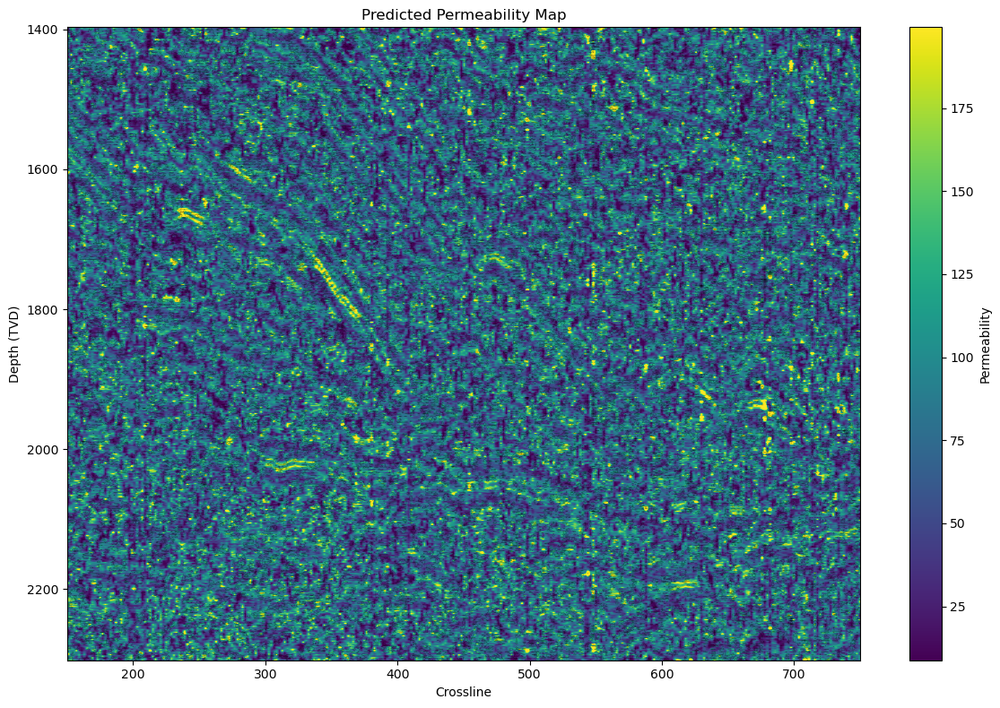

Saved map PNG to: predicted_perm_map_inline_348.png
Predictions: 642033 rows. Columns saved: depth, crossline, inst_freq, sweetness, grad, local_std, spec_slope, band_ratio_high_low, coherency, rms_w5 ...
Notes:
- If your model outputs log10(PERM) values, this script will apply 10**pred_log when median(pred_log)<10.
- If you want a strict behavior (always treat as log), change the logic in align_and_predict_chunk accordingly.


In [45]:
# Robust loader + predict + plotting cell (drop-in)
import os, sys, traceback
from dataclasses import dataclass
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
from math import isfinite

# optional fallback
try:
    import cloudpickle
except Exception:
    cloudpickle = None

try:
    import xgboost as xgb
except Exception:
    xgb = None

# --- USER CONFIG ---
TEST_CSV = "testing_perm_inline_348_A10 with coherency.csv"
MODEL_FILE = "xgb_earlystop_log_model.joblib"
SCALER_FILE = "scaler.joblib"
TRAIN_CSV = "new_training_permeability_dataset.csv"
OUT_PRED_CSV = "predicted_perm_inline_348.csv"
OUT_PIVOT_CSV = "predicted_perm_map_inline_348_pivot.csv"
OUT_PIVOT_PNG = "predicted_perm_map_inline_348.png"
CHUNK_SIZE = 50000

# --- 0) define a minimal __main__._Wrapper so unpickling can resolve the name ---
# Put this class in main module namespace BEFORE loading the model.
# It's permissive: accepts arbitrary attributes and stores them on itself.
class _Wrapper:
    def __init__(self, *args, **kwargs):
        # copy kwargs to attributes so unpickled object will have expected fields
        for k, v in kwargs.items():
            setattr(self, k, v)
    def __repr__(self):
        return f"<_Wrapper with attrs {list(self.__dict__.keys())}>"

# ensure it's accessible as __main__._Wrapper
_main = sys.modules.get("__main__")
if _main is not None:
    setattr(_main, "_Wrapper", _Wrapper)

# --- 1) load model & scaler robustly ---
model = None
scaler = None
errors = []

def try_joblib_load():
    global model, scaler
    model = joblib.load(MODEL_FILE)
    scaler = joblib.load(SCALER_FILE)

# attempt
try:
    if os.path.exists(MODEL_FILE) and os.path.exists(SCALER_FILE):
        try:
            try_joblib_load()
            print("Loaded model & scaler via joblib.")
        except Exception as e_job:
            errors.append(("joblib", e_job, traceback.format_exc()))
            print("joblib.load failed:", e_job)
            # try cloudpickle if available
            if cloudpickle is not None:
                try:
                    with open(MODEL_FILE, "rb") as f:
                        model = cloudpickle.load(f)
                    with open(SCALER_FILE, "rb") as f:
                        scaler = cloudpickle.load(f)
                    print("Loaded model & scaler via cloudpickle.")
                except Exception as e_cp:
                    errors.append(("cloudpickle", e_cp, traceback.format_exc()))
                    print("cloudpickle failed:", e_cp)
            else:
                print("cloudpickle not installed; skipping.")
    else:
        raise FileNotFoundError("Model/scaler files not found at configured paths.")
except Exception as e_final:
    # print diagnostics and re-raise so user sees why
    print("Final load error. Diagnostics:")
    for name, err, tb in errors:
        print(f"Attempt: {name}; Error: {err}")
        print("Traceback tail:\n", "\n".join(tb.splitlines()[-6:]))
    raise RuntimeError("Failed to load model/scaler. See diagnostics above.") from e_final

# --- 1b) Create a prediction function based on loaded object ---
predict_fn = None
# If object itself supports predict(X), use it (sklearn style)
if hasattr(model, "predict") and callable(getattr(model, "predict")):
    predict_fn = lambda Xs: model.predict(Xs)
    print("Using model.predict for predictions.")
else:
    # try to extract an xgboost Booster
    booster = None
    # common attribute names depending on how it was saved/wrapped
    for attr in ("booster", "_Booster", "get_booster", "booster_"):
        if hasattr(model, attr):
            val = getattr(model, attr)
            # if get_booster is callable, call it
            if callable(val):
                try:
                    booster = val()
                except Exception:
                    # some callables may expect args; skip
                    booster = None
            else:
                booster = val
            if booster is not None:
                break
    # sometimes the wrapper stored a 'model' attribute that is the raw Booster
    if booster is None and hasattr(model, "model"):
        booster = getattr(model, "model")
    # if booster is an xgboost Booster, create predict_fn using DMatrix
    if booster is not None and (xgb is not None) and isinstance(booster, xgb.core.Booster):
        def _pred_from_booster(Xs):
            dm = xgb.DMatrix(Xs)
            return booster.predict(dm)
        predict_fn = _pred_from_booster
        print("Extracted xgboost.core.Booster from wrapper and will use it for predictions.")
    else:
        # as last resort, if model has attribute 'get_fscore' or similar, try to treat model as Booster-like via xgb.Booster.load_model
        print("Could not find a standard predict() or xgboost.Booster inside the loaded model.")
        # print a bit of introspection to help debugging
        print("Loaded model type:", type(model))
        print("Model attributes:", [a for a in dir(model) if not a.startswith("__")][:50])
        raise RuntimeError("Loaded model is not directly usable: no predict() and no xgboost Booster found.")

# --- 2) determine training features & training mean imputation ---
feature_cols = None
feature_means = None

if hasattr(scaler, "feature_names_in_"):
    try:
        feature_cols = list(getattr(scaler, "feature_names_in_"))
    except Exception:
        feature_cols = None

if hasattr(scaler, "mean_") and feature_cols is None:
    # some sklearn scalers have .mean_ (but not names)
    try:
        arr = getattr(scaler, "mean_")
        if feature_cols is None:
            # fallback: numeric index names
            feature_cols = [f"f_{i}" for i in range(len(arr))]
        feature_means = dict(zip(feature_cols, list(arr)))
    except Exception:
        feature_means = None

if hasattr(scaler, "feature_means_"):
    try:
        feature_means = getattr(scaler, "feature_means_")
    except Exception:
        feature_means = None

# Fallback: infer from TRAIN_CSV
if feature_cols is None or feature_means is None:
    if os.path.exists(TRAIN_CSV):
        df_train_tmp = pd.read_csv(TRAIN_CSV, nrows=10)
        feature_cols = [c for c in df_train_tmp.columns if c.upper() not in ("PERM", "PERMEABILITY")]
        feature_means = pd.read_csv(TRAIN_CSV, usecols=feature_cols).mean().to_dict()
        print("Inferred features & means from TRAIN_CSV.")
    else:
        # try to infer feature names from TEST_CSV columns (best effort)
        if os.path.exists(TEST_CSV):
            df_tmp = pd.read_csv(TEST_CSV, nrows=5)
            # exclude coordinate columns likely present
            exclude = {"depth", "crossline", "inline", "x", "y", "PERM", "perm"}
            feature_cols = [c for c in df_tmp.columns if c not in exclude]
            # set means from that tiny sample
            feature_means = df_tmp[feature_cols].mean().to_dict()
            print("Inferred features from TEST_CSV (best-effort).")
        else:
            raise RuntimeError("Cannot determine feature_cols/feature_means. Provide scaler with metadata or TRAIN_CSV/TEST_CSV.")

# If feature_means is not a dict, try to align
if not isinstance(feature_means, dict):
    try:
        feature_means = dict(zip(feature_cols, list(feature_means)))
    except Exception:
        feature_means = {f: 0.0 for f in feature_cols}

print(f"Using {len(feature_cols)} features for prediction.")

# --- 3) helper to align chunk and predict (works with predict_fn expecting scaled features) ---
def align_and_predict_chunk(chunk_df):
    original = chunk_df.copy()
    aligned = pd.DataFrame(index=chunk_df.index)
    for f in feature_cols:
        if f in chunk_df.columns:
            aligned[f] = chunk_df[f].values
        else:
            aligned[f] = feature_means.get(f, 0.0)
    # replace inf/-inf then fill
    aligned = aligned.replace([np.inf, -np.inf], np.nan)
    aligned = aligned.fillna(pd.Series(feature_means))
    # scale using scaler (scaler expects 2d)
    Xs = scaler.transform(aligned.values)
    # if predict_fn expects raw Xs (sklearn) that's okay; if it is booster-based it expects raw numeric array for DMatrix
    preds = predict_fn(Xs)
    preds = np.asarray(preds, dtype=float)
    # if these preds are log10(PERM) as your pipeline expects, do inverse transform
    # You previously used 10**pred_log. Check type - if values are small (like 0-3) treat them as logs.
    # We'll be conservative: if median(preds) < 10, assume they are log10 and inverse-transform.
    if np.nanmedian(preds) < 10:
        pred_perm = 10 ** preds
        original["PRED_LOG_PERM"] = preds
        original["PRED_PERM"] = pred_perm
    else:
        # already in linear space
        original["PRED_PERM"] = preds
        original["PRED_LOG_PERM"] = np.log10(np.maximum(preds, 1e-12))
    return original

# --- 4) stream through test CSV and predict ---
if os.path.exists(OUT_PRED_CSV):
    os.remove(OUT_PRED_CSV)

rows = 0
for chunk in pd.read_csv(TEST_CSV, chunksize=CHUNK_SIZE):
    out_chunk = align_and_predict_chunk(chunk)
    if rows == 0:
        out_chunk.to_csv(OUT_PRED_CSV, index=False, mode="w")
    else:
        out_chunk.to_csv(OUT_PRED_CSV, index=False, header=False, mode="a")
    rows += len(out_chunk)
    print(f"Processed {rows} rows", end="\r")
print(f"\nFinished predictions. Saved to: {OUT_PRED_CSV}")

# --- 5) Build pivot and plot (depth increases downward) ---
df_out = pd.read_csv(OUT_PRED_CSV)
if "depth" in df_out.columns and "crossline" in df_out.columns:
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")
    df_map = df_out.dropna(subset=["depth", "crossline", "PRED_PERM"])
    pivot = df_map.pivot_table(index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean")
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    depths = pivot.index.values.astype(float)
    crosslines = pivot.columns.values.astype(float)
    data = pivot.values.astype(float)

    # ensure depths sorted ascending (shallow -> deep)
    order = np.argsort(depths)
    depths = depths[order]
    data = data[order, :]

    vmin, vmax = np.nanpercentile(data, [2, 98])

    plt.figure(figsize=(12, 8))
    im = plt.imshow(
        data,
        aspect='auto',
        origin='upper',  # top = smallest depth, so depth increases downward
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        interpolation='bilinear'
    )
    plt.colorbar(im, label="Permeability")
    plt.xlabel("Crossline")
    plt.ylabel("Depth (TVD)")
    plt.title("Predicted Permeability Map")
    plt.gca().invert_yaxis()  # make tick labels increase downward

    # optional contours (safe)
    try:
        X, Y = np.meshgrid(crosslines, depths)
        plt.contour(X, Y, data, levels=12, colors='k', linewidths=0.3, alpha=0.4)
    except Exception as e:
        print("Contour skipped (error):", e)

    plt.tight_layout()
    plt.show()

    # save with same origin so file matches figure
    try:
        plt.imsave(OUT_PIVOT_PNG, data, cmap='viridis', vmin=vmin, vmax=vmax, origin='upper')
        print("Saved map PNG to:", OUT_PIVOT_PNG)
    except Exception as e:
        print("Saving PNG failed:", e)
else:
    print("No depth/crossline found in predictions; saved only CSV.")

# --- 6) summary ---
n = len(df_out)
print(f"Predictions: {n} rows. Columns saved: {', '.join(df_out.columns[:10])} ...")
print("Notes:")
print("- If your model outputs log10(PERM) values, this script will apply 10**pred_log when median(pred_log)<10.")
print("- If you want a strict behavior (always treat as log), change the logic in align_and_predict_chunk accordingly.")


Saved pivot to: predicted_perm_map_inline_348_pivot.csv
✅ Saved high-resolution map to: predicted_perm_map_inline_348.png


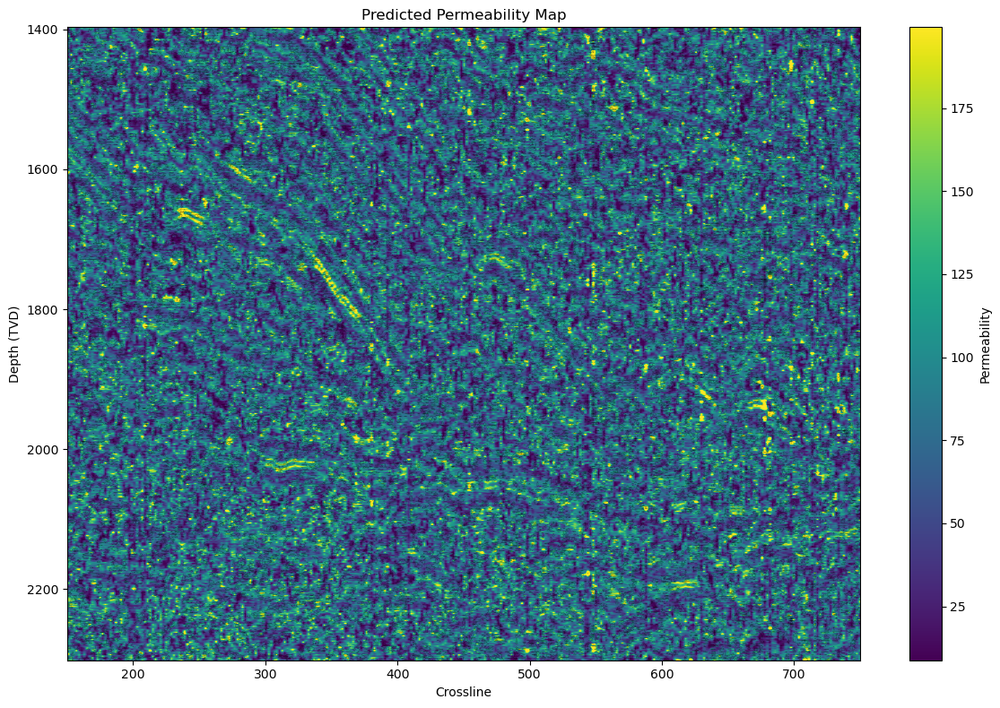

In [47]:
# --- 5) Build pivot map (depth x crossline) and plot with depth increasing downward ---
df_out = pd.read_csv(OUT_PRED_CSV)

if "depth" in df_out.columns and "crossline" in df_out.columns:
    # Ensure numeric
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")

    df_map = df_out.dropna(subset=["depth", "crossline", "PRED_PERM"])
    pivot = df_map.pivot_table(index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean")
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    # Extract arrays
    data = pivot.values
    depths = pivot.index.values.astype(float)
    crosslines = pivot.columns.values.astype(float)

    # Sort depths (ascending, shallow → deep)
    order = np.argsort(depths)
    depths = depths[order]
    data = data[order, :]

    # Clip color scale
    vmin, vmax = np.nanpercentile(data, [2, 98])

    # --- Plot ---
    fig, ax = plt.subplots(figsize=(12, 8))
    im = ax.imshow(
        data,
        aspect='auto',
        origin='upper',  # ensures depth increases downward
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        interpolation='bilinear'
    )

    # Colorbar + labels
    cbar = plt.colorbar(im, ax=ax, label="Permeability")
    ax.set_xlabel("Crossline")
    ax.set_ylabel("Depth (TVD)")
    ax.set_title("Predicted Permeability Map")

    # Invert Y-axis so depth increases downward
    ax.invert_yaxis()

    # Optional contours
    try:
        X, Y = np.meshgrid(crosslines, depths)
        ax.contour(X, Y, data, levels=12, colors='k', linewidths=0.3, alpha=0.4)
    except Exception as e:
        print("Contour overlay skipped:", e)

    plt.tight_layout()

    # --- Save high-resolution PNG ---
    fig.savefig(OUT_PIVOT_PNG, dpi=300, bbox_inches='tight')
    print(f"✅ Saved high-resolution map to: {OUT_PIVOT_PNG}")

    plt.show()

else:
    print("❌ Test CSV does not contain 'depth' and 'crossline' columns — only flat predictions saved.")


Saved pivot to: predicted_perm_map_inline_348_pivot.csv


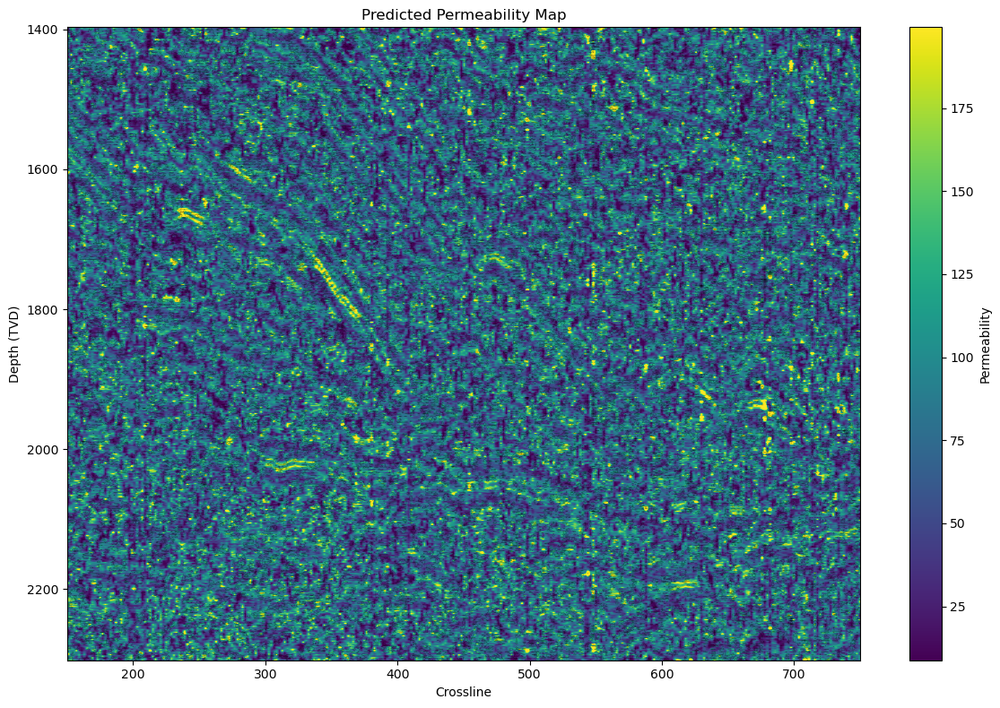

Saved map PNG to: predicted_perm_map_inline_348.png


In [49]:
# --- 5) build pivot map (depth x crossline) and plot (if both columns exist) ---
df_out = pd.read_csv(OUT_PRED_CSV)
if "depth" in df_out.columns and "crossline" in df_out.columns:
    # ensure numeric
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")
    df_map = df_out.dropna(subset=["depth","crossline","PRED_PERM"])
    pivot = df_map.pivot_table(index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean")
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    # convert to arrays and ensure depth ordering is ascending (shallow -> deep)
    data = pivot.values
    depths = pivot.index.values
    crosslines = pivot.columns.values.astype(float)

    # ensure depths are sorted ascending and reorder data to match
    order = np.argsort(depths)
    depths = depths[order]
    data = data[order, :]

    vmin, vmax = np.nanpercentile(data, [2, 98])

    plt.figure(figsize=(12,8))
    im = plt.imshow(
        data,
        aspect='auto',
        origin='upper',  # use 'upper' so the top of the figure is the smallest depth and depth increases downward
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap='viridis',
        vmin=vmin,
        vmax=vmax,
        interpolation='bilinear'
    )

    # overlay contour lines (use same data). Building mesh for contour:
    X, Y = np.meshgrid(crosslines, depths)
    # choose a reasonable number of levels (or set explicit levels)
    try:
        cs = plt.contour(X, Y, data, levels=12, colors='k', linewidths=0.3, alpha=0.4)
    except Exception:
        # fallback: no contour if contouring fails (e.g., NaNs)
        cs = None

    cbar = plt.colorbar(im, label="Permeability")
    plt.xlabel("Crossline")
    plt.ylabel("Depth (TVD)")
    plt.title("Predicted Permeability Map")
    # invert the y-axis so depth increases downward on axis ticks/labels (redundant with origin='upper' but explicit)
    plt.gca().invert_yaxis()
    plt.tight_layout()
    plt.show()

    # save png with same colormap and origin so saved image matches the display
    plt.imsave(OUT_PIVOT_PNG, data, cmap='viridis', vmin=vmin, vmax=vmax, origin='upper')
    print("Saved map PNG to:", OUT_PIVOT_PNG)
else:
    print("Test CSV does not contain 'depth' and 'crossline' columns — saved only flat predictions CSV.")


Saved pivot to: predicted_perm_map_inline_348_pivot.csv


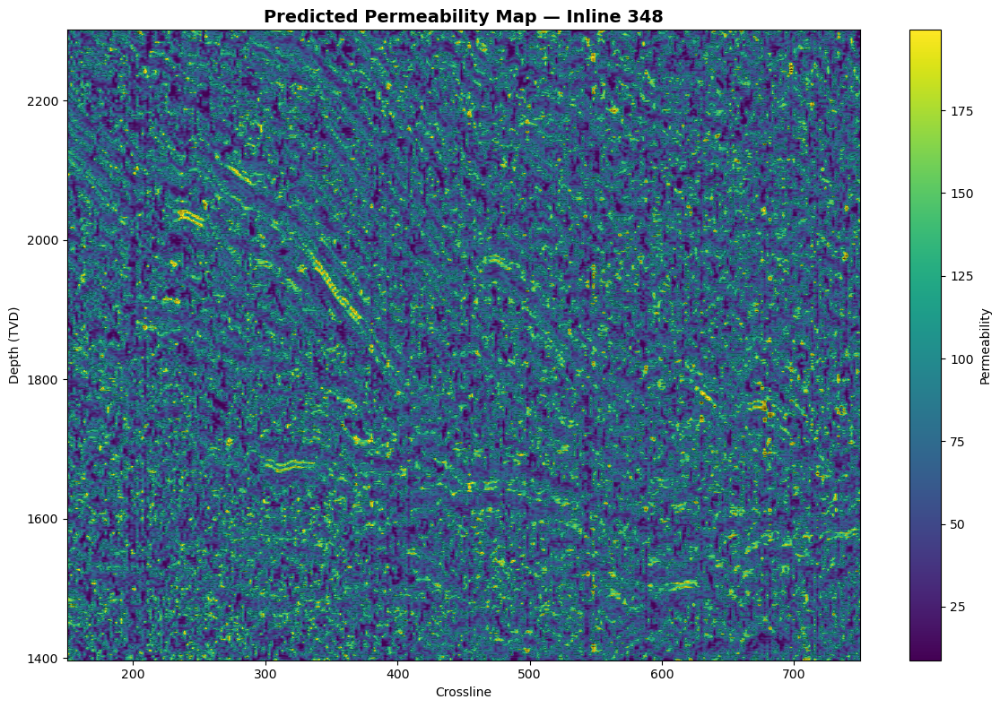

✅ Saved corrected permeability map to: predicted_perm_map_inline_348.png


In [59]:
# --- 5) Build pivot and plot (match porosity orientation exactly) ---
df_out = pd.read_csv(OUT_PRED_CSV)

if "depth" in df_out.columns and "crossline" in df_out.columns:
    # Ensure numeric
    df_out["depth"] = pd.to_numeric(df_out["depth"], errors="coerce")
    df_out["crossline"] = pd.to_numeric(df_out["crossline"], errors="coerce")
    df_map = df_out.dropna(subset=["depth", "crossline", "PRED_PERM"])

    # Pivot table: index = depth, columns = crossline
    pivot = df_map.pivot_table(
        index="depth", columns="crossline", values="PRED_PERM", aggfunc="mean"
    )
    pivot.to_csv(OUT_PIVOT_CSV)
    print("Saved pivot to:", OUT_PIVOT_CSV)

    # Extract arrays
    depths = pivot.index.values.astype(float)
    crosslines = pivot.columns.values.astype(float)
    data = pivot.values.astype(float)

    # ✅ Sort depths in ascending order (shallow → deep)
    order = np.argsort(depths)
    depths = depths[order]
    data = data[order, :]

    # ✅ DO NOT use origin='upper'
    # Porosity map used origin='lower' (0-depth bottom-left)
    vmin, vmax = np.nanpercentile(data, [2, 98])

    fig, ax = plt.subplots(figsize=(12, 8))
    im = ax.imshow(
        data,
        aspect="auto",
        origin="lower",  # same as porosity!
        extent=[crosslines.min(), crosslines.max(), depths.min(), depths.max()],
        cmap="viridis",
        vmin=vmin,
        vmax=vmax,
        interpolation="bilinear",
    )

    cbar = plt.colorbar(im, ax=ax, label="Permeability")
    ax.set_xlabel("Crossline")
    ax.set_ylabel("Depth (TVD)")
    ax.set_title("Predicted Permeability Map — Inline 348", fontsize=14, weight="bold")

    # ✅ No invert_yaxis (porosity didn’t use it)
    # Depth increases downward naturally because origin='lower'

    # Optional contours
    try:
        X, Y = np.meshgrid(crosslines, depths)
        ax.contour(X, Y, data, levels=12, colors="k", linewidths=0.3, alpha=0.4)
    except Exception as e:
        print("Contour skipped:", e)

    plt.tight_layout()

    # ✅ Save the figure as high-res PNG (same as porosity)
    fig.savefig(OUT_PIVOT_PNG, dpi=300, bbox_inches="tight")
    plt.show()
    print("✅ Saved corrected permeability map to:", OUT_PIVOT_PNG)

else:
    print("❌ Missing 'depth' or 'crossline' column — saved only CSV.")


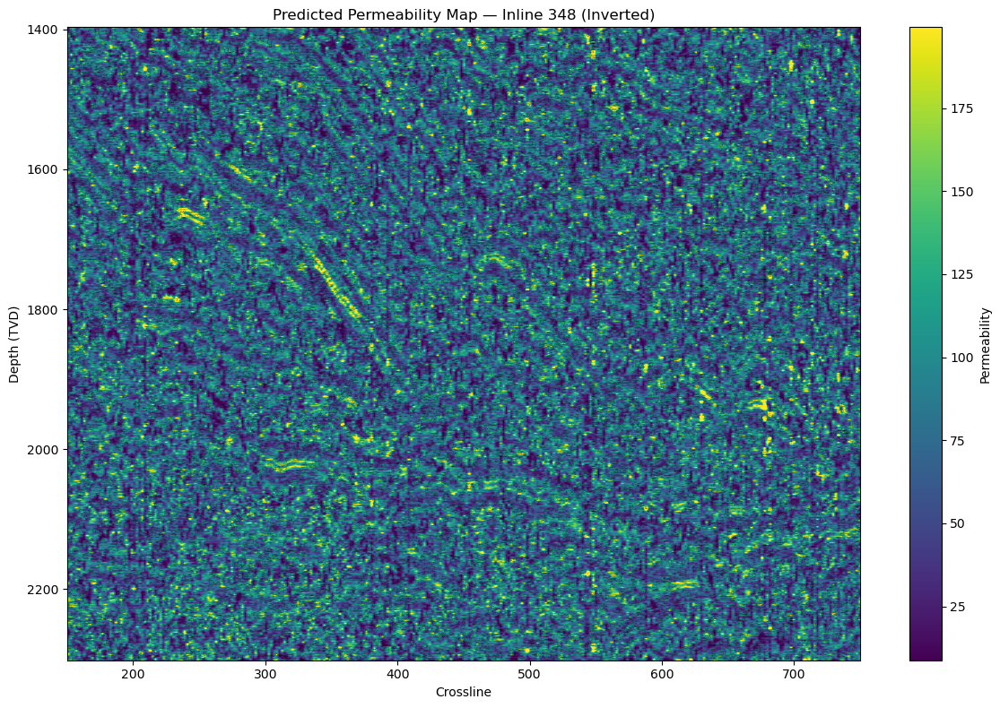

Saved inverted permeability map to: predicted_perm_map_inline_348_inverted.png


In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# filenames (adjust if different)
PIVOT_CSV = "predicted_perm_map_inline_348_pivot.csv"   # pivot created earlier
OUT_PNG = "predicted_perm_map_inline_348_inverted.png"

# load pivot (depth index x crossline columns)
pivot = pd.read_csv(PIVOT_CSV, index_col=0)
depths = pivot.index.values.astype(float)
crosslines = pivot.columns.values.astype(float)
data = pivot.values.astype(float)

# Ensure depths are sorted ascending (shallow -> deep)
order = np.argsort(depths)
depths = depths[order]
data = data[order, :]

# Flip vertically to invert the image (swap top/bottom)
data_flipped = np.flipud(data)   # equivalent to data[::-1, :]

# After flipping we must also flip the depths so they match the rows
depths_flipped = depths[::-1]

# Use origin='lower' so depth increases downward (and matches porosity)
vmin, vmax = np.nanpercentile(data_flipped, [2, 98])

fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(
    data_flipped,
    aspect='auto',
    origin='lower',
    extent=[crosslines.min(), crosslines.max(), depths_flipped.min(), depths_flipped.max()],
    cmap='viridis',
    vmin=vmin,
    vmax=vmax,
    interpolation='bilinear'
)
ax.set_xlabel("Crossline")
ax.set_ylabel("Depth (TVD)")
ax.set_title("Predicted Permeability Map — Inline 348 (Inverted)")
ax.invert_yaxis()   # make tick labels increase downward (explicit)

# optional contours to help compare
try:
    X, Y = np.meshgrid(crosslines, depths_flipped)
    ax.contour(X, Y, data_flipped, levels=12, colors='k', linewidths=0.3, alpha=0.4)
except Exception:
    pass

plt.colorbar(im, label="Permeability")
plt.tight_layout()
fig.savefig(OUT_PNG, dpi=300, bbox_inches='tight')
plt.show()

print("Saved inverted permeability map to:", OUT_PNG)


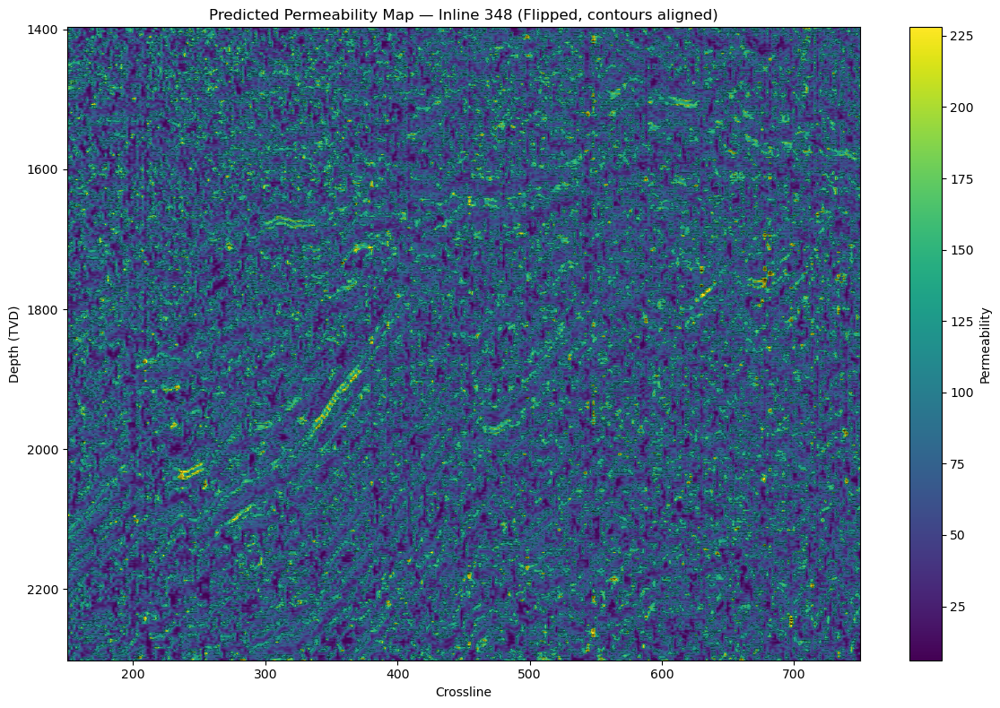

Saved fully flipped permeability map with aligned contours to: predicted_perm_map_inline_348_flipped_contours_fixed.png


In [73]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

PIVOT_CSV = "predicted_perm_map_inline_348_pivot.csv"
OUT_PNG = "predicted_perm_map_inline_348_flipped_contours_fixed.png"

# load pivot (depth index x crossline columns)
pivot = pd.read_csv(PIVOT_CSV, index_col=0)

# sort depths ascending (shallow -> deep) and make sure data rows match that order
depths = np.array(pivot.index.astype(float))
order = np.argsort(depths)
depths_asc = depths[order]
crosslines = np.array([float(c) for c in pivot.columns])
data = pivot.values.astype(float)[order, :]   # rows correspond to depths_asc

# Flip the entire image (mirror top <-> bottom)
data_flipped = np.flipud(data)   # now row 0 corresponds to the original last depth

# Define plot extent from the original (ascending) depth range
xmin, xmax = crosslines.min(), crosslines.max()
ymin, ymax = depths_asc.min(), depths_asc.max()
extent = [xmin, xmax, ymin, ymax]

# compute robust vmin/vmax
vmin, vmax = np.nanpercentile(data_flipped, [1, 99])

fig, ax = plt.subplots(figsize=(12, 8))

# Show the flipped image. Use origin='upper' so first row maps to y = ymax
im = ax.imshow(
    data_flipped,
    aspect='auto',
    origin='upper',
    extent=extent,
    cmap='viridis',
    vmin=vmin,
    vmax=vmax,
    interpolation='bilinear'
)

# Build contour grid that matches imshow mapping:
# - x coords increase left->right
# - y coords must go top->bottom to match origin='upper', so use linspace(ymax, ymin, nrows)
nrows, ncols = data_flipped.shape
x_coords = np.linspace(xmin, xmax, ncols)
y_coords = np.linspace(ymax, ymin, nrows)   # note ymax -> ymin (descending)
Xc, Yc = np.meshgrid(x_coords, y_coords)

# Overlay contours on the same (flipped) data
try:
    ax.contour(Xc, Yc, data_flipped, levels=12, colors='k', linewidths=0.3, alpha=0.5)
except Exception as e:
    print("Contour overlay failed:", e)

# Labels / colorbar (do NOT invert yaxis)
ax.set_xlabel("Crossline")
ax.set_ylabel("Depth (TVD)")
ax.invert_yaxis()   # make tick labels increase downward (explicit)

ax.set_title("Predicted Permeability Map — Inline 348 (Flipped, contours aligned)")
plt.colorbar(im, ax=ax, label="Permeability")
plt.tight_layout()

# Save high-res PNG
fig.savefig(OUT_PNG, dpi=300, bbox_inches='tight')
plt.show()

print("Saved fully flipped permeability map with aligned contours to:", OUT_PNG)


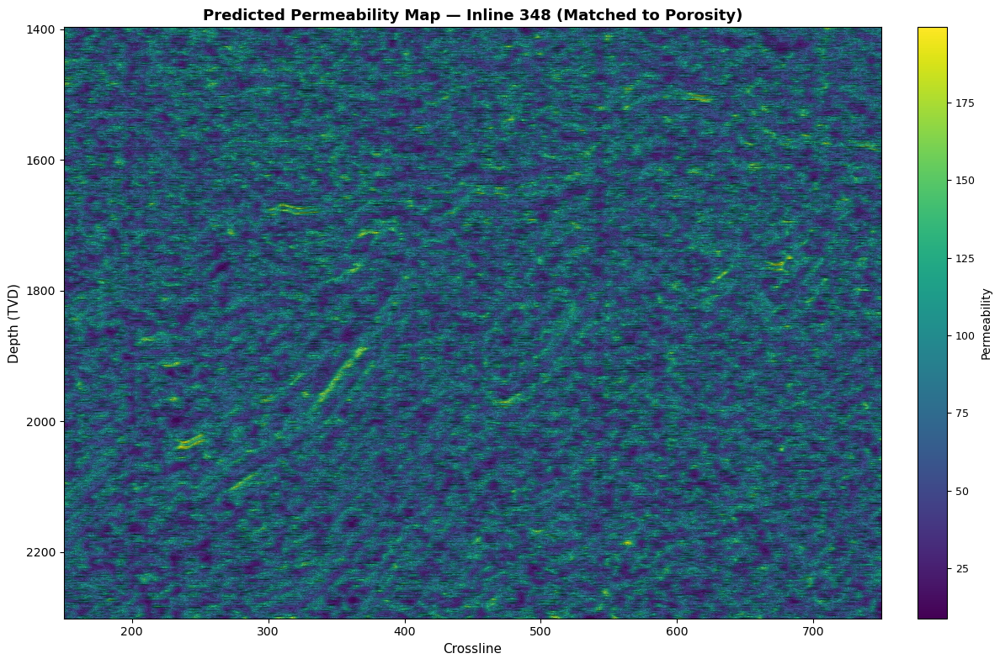

Saved permeability image matched to porosity appearance: predicted_perm_map_inline_348_match_poro.png
Used clipping vmin=8.78, vmax=199.34, gaussian sigma=0.8, interpolation=bicubic


In [86]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# --- User config (tweak if needed) ---
PIVOT_CSV = "predicted_perm_map_inline_348_pivot.csv"
OUT_PNG = "predicted_perm_map_inline_348_match_poro.png"
GAUSS_SIGMA = 0.8         # same as porosity code
PCTL_LOW, PCTL_HIGH = 2, 98   # match porosity percentile clipping
CMAP = "viridis"         # same colormap as your porosity plot
CONTOUR_LEVELS = 12
INTERPOLATION = "bicubic"  # match porosity
DPI = 300
# ------------------------------

# load pivot (depth index x crossline columns)
pivot = pd.read_csv(PIVOT_CSV, index_col=0)

# prepare arrays: ensure depths ascend and rows correspond accordingly
depths = np.array(pivot.index.astype(float))
order = np.argsort(depths)
depths_asc = depths[order]
crosslines = np.array([float(c) for c in pivot.columns])
data = pivot.values.astype(float)[order, :]   # rows correspond to depths_asc

# Flip vertically to match porosity visual orientation (mirror top <-> bottom)
data_flipped = np.flipud(data)

# Smooth (gaussian) and clip to percentiles (like porosity)
finite_mask = np.isfinite(data_flipped)
if finite_mask.any():
    vmin, vmax = np.nanpercentile(data_flipped[finite_mask], [PCTL_LOW, PCTL_HIGH])
else:
    vmin, vmax = 0.0, 1.0

# clip extremes and smooth to reduce speckle (same approach as porosity)
data_clipped = np.clip(data_flipped, vmin, vmax)
data_smooth = gaussian_filter(data_clipped, sigma=GAUSS_SIGMA)

# Build extent: use original depth range (ascending). extent = [xmin, xmax, ymin, ymax]
xmin, xmax = crosslines.min(), crosslines.max()
ymin, ymax = depths_asc.min(), depths_asc.max()
extent = [xmin, xmax, ymin, ymax]

# Plot
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(
    data_smooth,
    extent=extent,
    cmap=CMAP,
    aspect='auto',
    origin='upper',      # row 0 of data_smooth → ymax (top); matches flip above
    vmin=vmin,
    vmax=vmax,
    interpolation=INTERPOLATION
)

# Build contour grid aligned to the displayed image (y descending to match origin='upper')
nrows, ncols = data_smooth.shape
x_coords = np.linspace(xmin, xmax, ncols)
y_coords = np.linspace(ymax, ymin, nrows)   # descending order for origin='upper'
Xc, Yc = np.meshgrid(x_coords, y_coords)

try:
    ax.contour(Xc, Yc, data_smooth, levels=CONTOUR_LEVELS, colors='k', linewidths=0.3, alpha=0.4)
except Exception as e:
    print("Contour overlay failed:", e)

# Labels / styling (matching porosity)
ax.set_xlabel("Crossline", fontsize=11)
ax.set_ylabel("Depth (TVD)", fontsize=11)
ax.set_title("Predicted Permeability Map — Inline 348 (Matched to Porosity)", fontsize=13, weight="bold")

# Invert y-axis so depth ticks increase downward (same visual as porosity)
ax.invert_yaxis()

# Colorbar (matches porosity layout)
cbar = plt.colorbar(im, fraction=0.046, pad=0.04)
cbar.set_label("Permeability", fontsize=10)
cbar.ax.tick_params(labelsize=9)

plt.tight_layout()
fig.savefig(OUT_PNG, dpi=DPI, bbox_inches='tight')
plt.show()

print(f"Saved permeability image matched to porosity appearance: {OUT_PNG}")
print(f"Used clipping vmin={vmin:.2f}, vmax={vmax:.2f}, gaussian sigma={GAUSS_SIGMA}, interpolation={INTERPOLATION}")


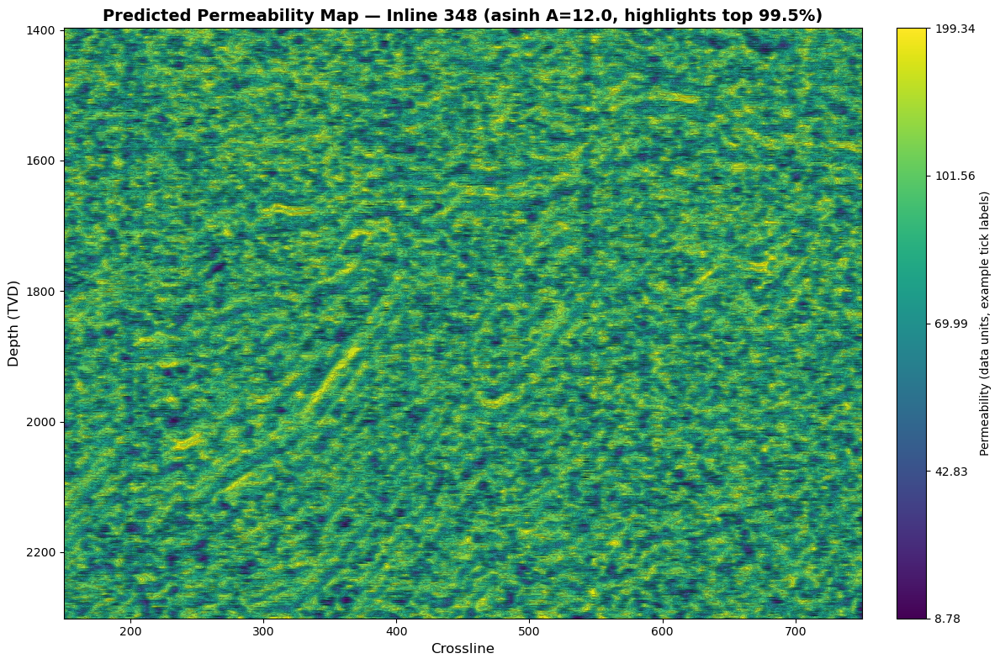

Saved enhanced permeability map (asinh stretch + highlights) to: predicted_perm_map_inline_348_highlight_highs.png
Clipping range: vmin=8.78, vmax=199.34; highlight threshold = 259.55


In [90]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ---------- CONFIG ----------
PIVOT_CSV = "predicted_perm_map_inline_348_pivot.csv"
OUT_PNG = "predicted_perm_map_inline_348_highlight_highs.png"
GAUSS_SIGMA = 0.8           # slight smoothing (as before)
PCTL_LOW, PCTL_HIGH = 2, 98 # clipping range
ASINH_A = 12.0              # asinh stretch strength (try 6, 12, 24)
CMAP = "viridis"              # perceptually-strong colormap
INTERPOLATION = "bicubic"
HIGHLIGHT_PCTL = 99.5       # contour/overlay for the very-high values
HIGHLIGHT_COLOR = "yellow"  # color used to highlight top zones
DPI = 300
# ---------- END CONFIG ----------

# load pivot
pivot = pd.read_csv(PIVOT_CSV, index_col=0)

# prepare arrays
depths = np.array(pivot.index.astype(float))
order = np.argsort(depths)
depths_asc = depths[order]
crosslines = np.array([float(c) for c in pivot.columns])
data = pivot.values.astype(float)[order, :]   # rows correspond to depths_asc

# flip so top row is top visually
data_flipped = np.flipud(data)

# smoothing + percentile clipping (robust to outliers)
finite = np.isfinite(data_flipped)
vmin, vmax = np.nanpercentile(data_flipped[finite], [PCTL_LOW, PCTL_HIGH])
data_clip = np.clip(data_flipped, vmin, vmax)
data_smooth = gaussian_filter(data_clip, sigma=GAUSS_SIGMA)

# normalize to 0..1
y = (data_smooth - vmin) / (vmax - vmin + 1e-20)
y = np.clip(y, 0.0, 1.0)

# asinh stretch: scaled = asinh(A * y) / asinh(A)
A = float(ASINH_A)
stretched = np.arcsinh(A * y) / np.arcsinh(A)

# (optional) slightly rescale so highest values occupy full [0,1] after stretch
stretched = (stretched - stretched.min()) / (stretched.max() - stretched.min() + 1e-20)

# build extent
xmin, xmax = crosslines.min(), crosslines.max()
ymin, ymax = depths_asc.min(), depths_asc.max()
extent = [xmin, xmax, ymin, ymax]

# plot
fig, ax = plt.subplots(figsize=(12, 8))
im = ax.imshow(
    stretched,
    extent=extent,
    cmap=CMAP,
    origin='upper',
    aspect='auto',
    interpolation=INTERPOLATION,
    vmin=0.0, vmax=1.0
)

# Overlay contours for context (use stretched values)
nrows, ncols = stretched.shape
x_coords = np.linspace(xmin, xmax, ncols)
y_coords = np.linspace(ymax, ymin, nrows)   # descending for origin='upper'
Xc, Yc = np.meshgrid(x_coords, y_coords)
ax.contour(Xc, Yc, stretched, levels=12, colors='k', linewidths=0.25, alpha=0.45)

# Highlight the very-high-perm zones: compute threshold in original units
highlight_thresh = np.nanpercentile(data_flipped[finite], HIGHLIGHT_PCTL)
mask_high = (data_flipped >= highlight_thresh)

# overlay a semi-transparent filled contour for the high zones (in original coords)
try:
    # convert boolean mask to numeric grid matching Xc/Yc
    ax.contourf(Xc, Yc, mask_high.astype(float), levels=[0.5, 1.5],
                colors=[HIGHLIGHT_COLOR], alpha=0.35, antialiased=True)
except Exception as e:
    print("Highlight overlay failed (fallback to boundary contour):", e)
    # fallback: draw boundary contour around high zones
    ax.contour(Xc, Yc, mask_high.astype(float), levels=[0.5], colors=HIGHLIGHT_COLOR, linewidths=1.0)

# labels and style
ax.set_xlabel("Crossline", fontsize=12)
ax.set_ylabel("Depth (TVD)", fontsize=12)
ax.set_title(f"Predicted Permeability Map — Inline 348 (asinh A={A}, highlights top {HIGHLIGHT_PCTL}%)", fontsize=14, weight="bold")
ax.invert_yaxis()

# colorbar (note: colorbar is for stretched 0..1 values; annotate with original units for reference)
cbar = plt.colorbar(im, ax=ax, fraction=0.045, pad=0.04)
# show example tick labels mapped back to original data units:
ticks_norm = np.linspace(0.0, 1.0, 5)
# inverse of asinh stretch to map ticks -> original y values:
# y = 1/A * sinh( asinh(A*orig_norm) ) ??? simpler: map via linear legend: show original data units for a few percentiles
tick_vals_original = np.nanpercentile(data_flipped[finite], [PCTL_LOW, 25, 50, 75, PCTL_HIGH])
cbar.set_ticks(np.linspace(0, 1, len(tick_vals_original)))
cbar.set_ticklabels([f"{t:.2f}" for t in tick_vals_original])
cbar.set_label("Permeability (data units, example tick labels)")

plt.tight_layout()
fig.savefig(OUT_PNG, dpi=DPI, bbox_inches='tight')
plt.show()

print("Saved enhanced permeability map (asinh stretch + highlights) to:", OUT_PNG)
print(f"Clipping range: vmin={vmin:.2f}, vmax={vmax:.2f}; highlight threshold = {highlight_thresh:.2f}")
